## Import Libraries and Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from PIL import Image
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
img_size = 128
# VGG networks are trained on images with each channel normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]
stats = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
transformer = transforms.Compose([
    transforms.Resize((img_size,img_size),Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(*stats)  
])

def load_image(path):
    image = Image.open(path).convert('RGB')
    image = transformer(image).unsqueeze(0)
    # add extra dim to fit input dim
    return image

style_img = load_image('../input/nstdataset/style-img.jpg')
content_img = load_image('../input/nstdataset/content-img.jpg')

## Helper Functions

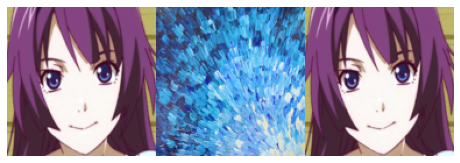

In [4]:
def denorm(img_batch):
    return img_batch * stats[1][0] + stats[0][0]
    # Rescale the normalised images to (0,1)
    
def images_preview(content_img,style_img,generated_image):
    fig, ax = plt.subplots(figsize=(8, 10))
    ax.axis('off')
    grid1 = make_grid(denorm(content_img), nrow=1)    
    grid2 = make_grid(denorm(style_img), nrow=1)
    grid3 = make_grid(denorm(generated_image), nrow=1)    
    img_grid = torch.cat((grid1, grid2, grid3), -1)
    ax.imshow(make_grid(img_grid, nrow=1).permute(1, 2, 0))
    
generated_image = content_img.clone()
images_preview(content_img,style_img,generated_image.detach())
# For first iter generated image will be the same as content image

## VGG19

In [5]:
vgg_model = models.vgg19(pretrained = True).features
print(vgg_model)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [6]:
for name, layer in vgg_model._modules.items():
    print(name,layer)

0 Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1 ReLU(inplace=True)
2 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3 ReLU(inplace=True)
4 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
5 Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
6 ReLU(inplace=True)
7 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
8 ReLU(inplace=True)
9 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
10 Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
11 ReLU(inplace=True)
12 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
13 ReLU(inplace=True)
14 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
15 ReLU(inplace=True)
16 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
17 ReLU(inplace=True)
18 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
19 Conv2d(256, 512, kernel_size=(3, 3)

## Get Features From VGG Model

In [7]:
class VGG_5(nn.Module):
    def __init__(self):
        super(VGG_5, self).__init__()
        # content_layer : conv_4
        # style_layers : conv_1, conv_2, conv_3, conv_4, conv_5
        # as mentioned in the paper we will need only upto 5 conv blocks i.e. upto 28 layers
        # i.e. layer: 0, 5, 10, 19, 28
        self.vgg_model = models.vgg19(pretrained = True).features[:29]
        
    def forward(self,image):
        x = image.to(device)
        features = []
        for num, layer in self.vgg_model._modules.items():            
            x = layer(x)
            if num in ['0', '5', '10', '19', '28']:
                features.append(x)
                
                
        return features

## Gram Matrix

In [8]:
def compute_gram_mat(feature):
    _,channel,height,width = feature.size()
    feature = feature.view(channel,height*width)
    # multiply h*w so that we will multiply feature accd to each channel
    gram_mat = torch.mm(feature,feature.t())
    # multiply with transpose
    return gram_mat

In [9]:
EPOCHS = 30
optimizer = torch.optim.LBFGS([generated_image.requires_grad_()])
vgg_model = VGG_5().to(device).eval()
content_weight = 1  # alpha
style_weight = 0.0001  # beta

Content Loss: 0.0, Style Loss: 144754272.0
Content Loss: 0.00045571429654955864, Style Loss: 144648896.0
Content Loss: 6.461893558502197, Style Loss: 129322016.0
Content Loss: 18.85907554626465, Style Loss: 116808200.0
Content Loss: 39.952518463134766, Style Loss: 106221816.0
Content Loss: 55.012229919433594, Style Loss: 100244664.0
Content Loss: 72.65740203857422, Style Loss: 93311472.0
Content Loss: 96.1327896118164, Style Loss: 84596800.0
Content Loss: 114.35981750488281, Style Loss: 78358520.0
Content Loss: 122.76072692871094, Style Loss: 71468456.0
Content Loss: 127.63725280761719, Style Loss: 62874600.0
Content Loss: 138.09214782714844, Style Loss: 56074556.0
Content Loss: 135.39193725585938, Style Loss: 47788868.0
Content Loss: 135.8392333984375, Style Loss: 41702568.0
Content Loss: 142.65122985839844, Style Loss: 36924168.0
Content Loss: 143.40968322753906, Style Loss: 27205884.0
Content Loss: 138.6999053955078, Style Loss: 17603896.0
Content Loss: 143.77670288085938, Style Los

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Content Loss: 105.01705932617188, Style Loss: 211961.625
Content Loss: 105.02694702148438, Style Loss: 211625.703125
Content Loss: 104.99781799316406, Style Loss: 211628.359375
Content Loss: 104.96122741699219, Style Loss: 211658.375
Content Loss: 104.94486999511719, Style Loss: 211454.1875
Content Loss: 104.94624328613281, Style Loss: 211135.5625
Content Loss: 104.96239471435547, Style Loss: 210716.8125
Content Loss: 104.8892822265625, Style Loss: 211102.3125
Content Loss: 105.00128173828125, Style Loss: 209677.0
Content Loss: 104.91447448730469, Style Loss: 210241.96875
Content Loss: 104.830810546875, Style Loss: 210832.625
Content Loss: 104.7914047241211, Style Loss: 210967.359375
Content Loss: 104.74028015136719, Style Loss: 211140.75
Content Loss: 104.80482482910156, Style Loss: 210174.5
Content Loss: 104.79293823242188, Style Loss: 210028.3125
Content Loss: 104.82283782958984, Style Loss: 209455.65625
Content Loss: 104.76893615722656, Style Loss: 209668.25
Content Loss: 103.22283

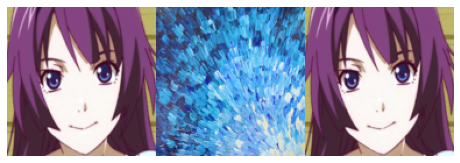

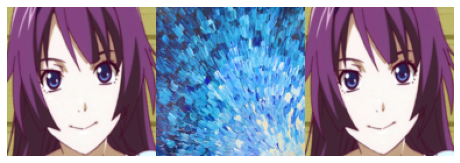

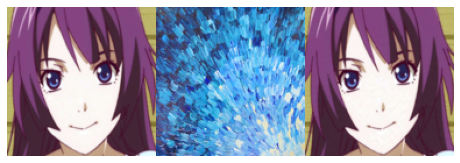

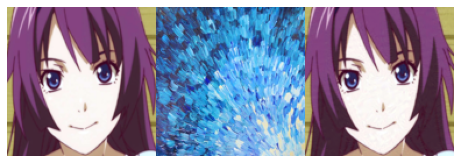

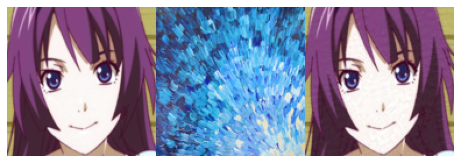

...

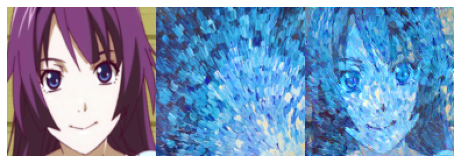

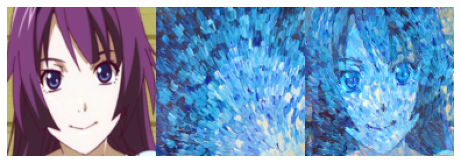

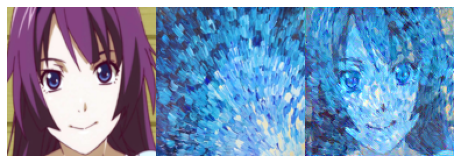

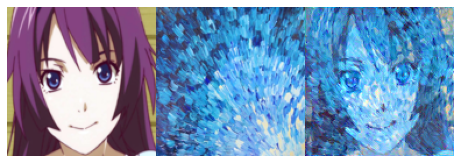

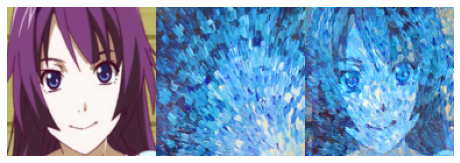

In [10]:
for epoch in range(EPOCHS):
    def closure():
        optimizer.zero_grad()
        content_features = vgg_model(content_img)
        style_features = vgg_model(style_img)
        generated_features = vgg_model(generated_image)

        style_loss, content_loss = 0, 0
        
        for content_feature,style_feature,gen_feature in zip(content_features,style_features,generated_features):
            content_loss += torch.mean((gen_feature-content_feature)**2)
            gram_gen = compute_gram_mat(gen_feature)
            gram_style = compute_gram_mat(style_feature)
            style_loss += torch.mean((gram_gen-gram_style)**2)
        
        total_loss = content_weight * content_loss + style_weight * style_loss
        total_loss.backward()
            

        if epoch % 10 == 0 :            
            print('Content Loss: {}, Style Loss: {}'.format(content_loss.item(),style_loss.item()))
            images_preview(content_img,style_img,generated_image.detach().cpu())
                    
        return total_loss
            
    optimizer.step(closure)